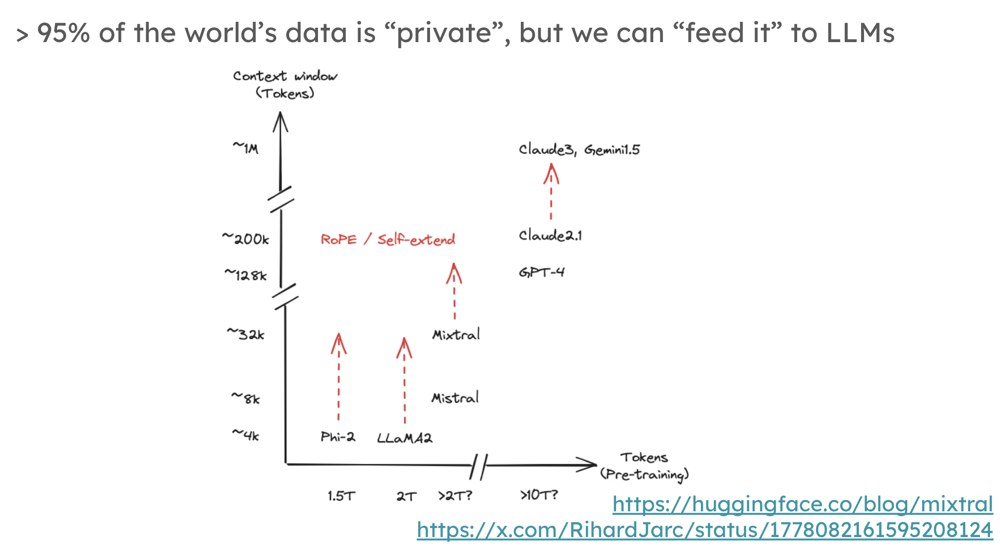

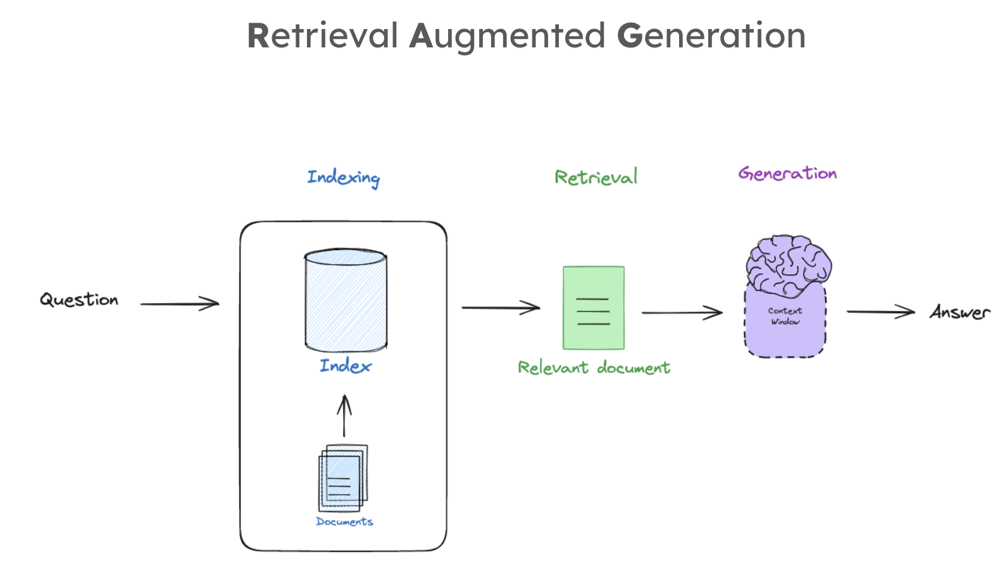

# Rag From Scratch: Overview

These notebooks walk through the process of building RAG app(s) from scratch.

They will build towards a broader understanding of the RAG langscape, as shown here:

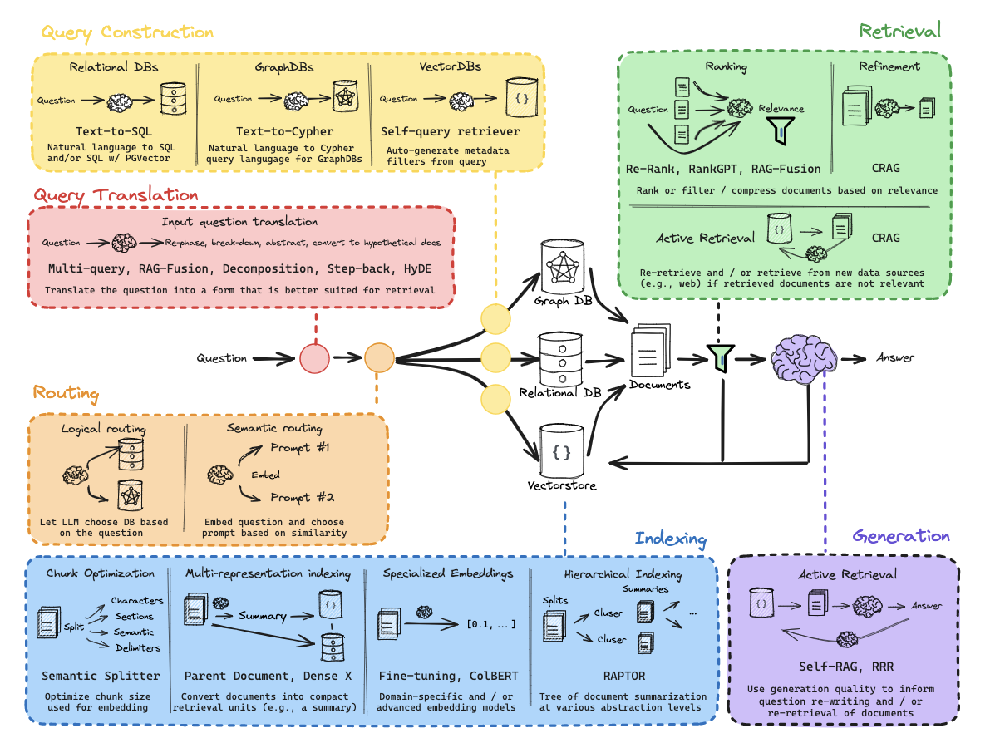

## Enviornment

In [1]:
# ! pip install langchain_community tiktoken langchain-openai langchainhub chromadb langchain

In [1]:
from dotenv import load_dotenv
load_dotenv()

PAGE_ID = "3565977727"  # SelectiveKD

QUESTION = "What is SelectiveKD and how does it improve cancer detection in Digital Breast Tomosynthesis (DBT)?"


## Part 1: Overview
 
[RAG quickstart](https://python.langchain.com/docs/use_cases/question_answering/quickstart)

In [2]:
import textwrap
from langchain import hub
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.vectorstores import Chroma
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from langchain_openai import ChatOpenAI, OpenAIEmbeddings

from src.data_loader.confluence_loader import ConfluenceLoader
from src.data_processor.processor import DataProcessor

def wrapprint(text, width=80):
    print(textwrap.fill(text, width=width))

#### INDEXING ####
loader = ConfluenceLoader()
docs = [loader.get_page_content(page_id=PAGE_ID)]

data_processor = DataProcessor()
processed_docs = data_processor.process_documents(docs)

# Split
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
splits = text_splitter.split_documents(processed_docs)

# Embed
vectorstore = Chroma.from_documents(documents=splits, 
                                    embedding=OpenAIEmbeddings())

retriever = vectorstore.as_retriever()

#### RETRIEVAL and GENERATION ####

# Prompt
prompt = hub.pull("rlm/rag-prompt")

# LLM
llm = ChatOpenAI(model_name="gpt-3.5-turbo", temperature=0)

# Post-processing
def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)

# Chain
rag_chain = (
    {"context": retriever | format_docs, "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

# Question
answer = rag_chain.invoke(QUESTION)

print("Question:")
wrapprint(QUESTION)
print("\nAnswer:")
wrapprint(answer)


Question:
What is SelectiveKD and how does it improve cancer detection in Digital Breast
Tomosynthesis (DBT)?

Answer:
SelectiveKD is a semi-supervised learning framework for building cancer
detection models for DBT that utilizes unannotated slices from a DBT stack to
improve cancer classification performance and generalization. It leverages
pseudo-labeling to select a few slices for training, minimizing noise and
reinforcing weak annotations. This approach allows for the use of all slices in
the DBT stack during training.


## Part 2: Indexing

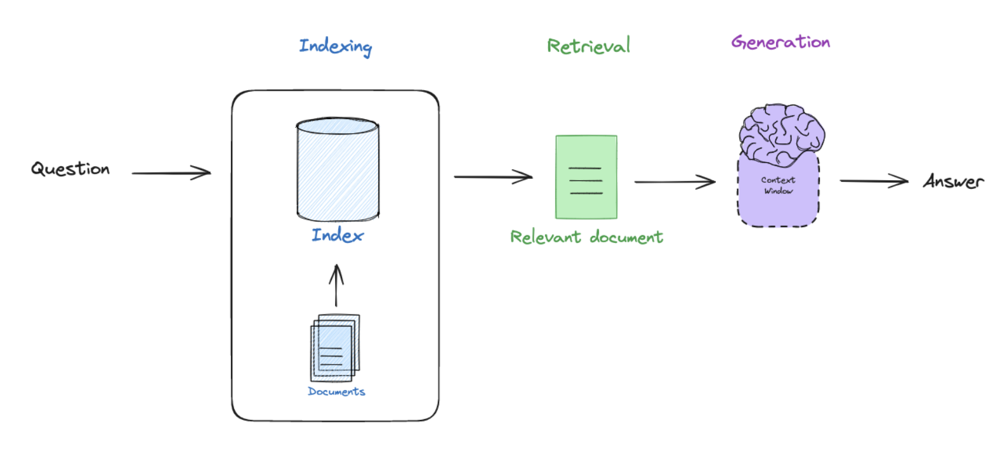

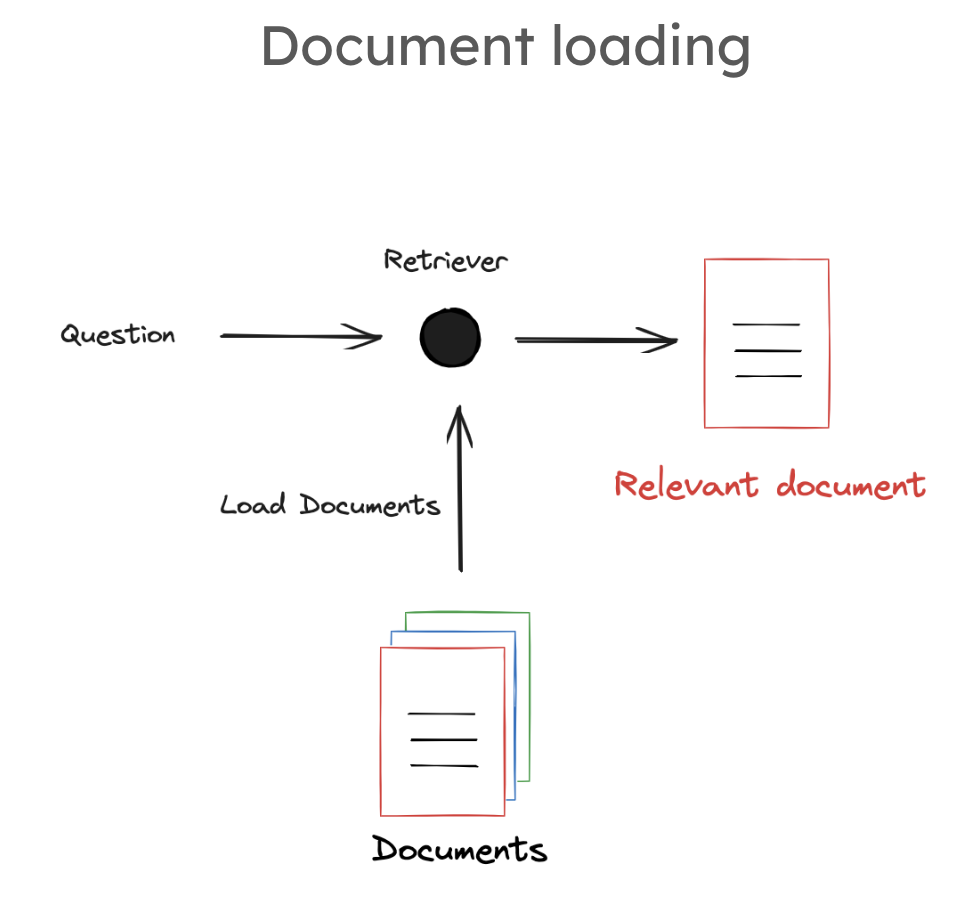

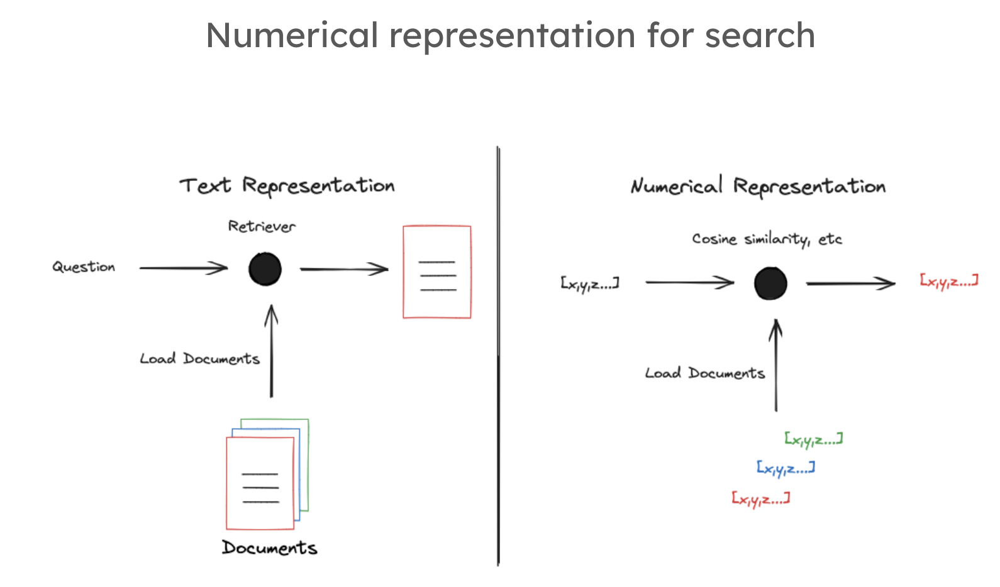

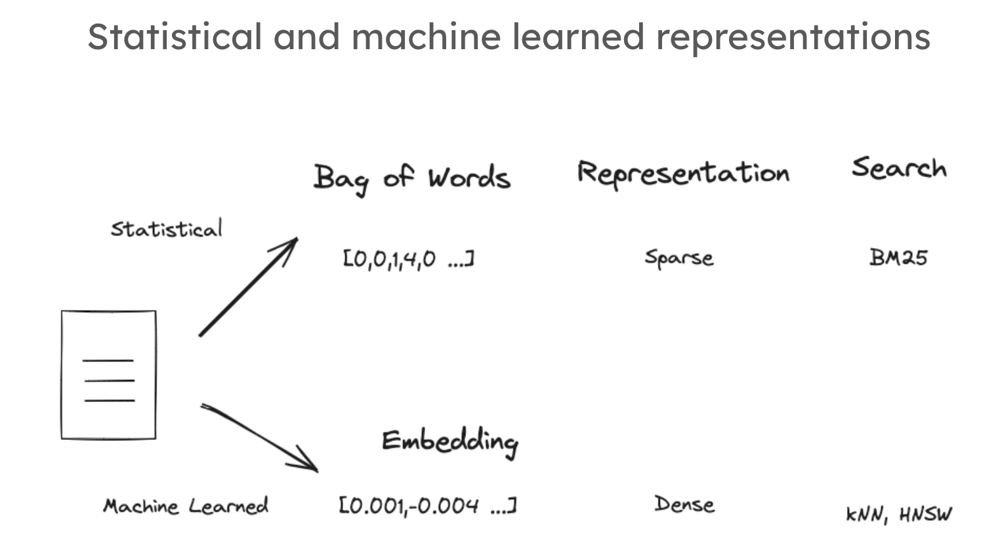

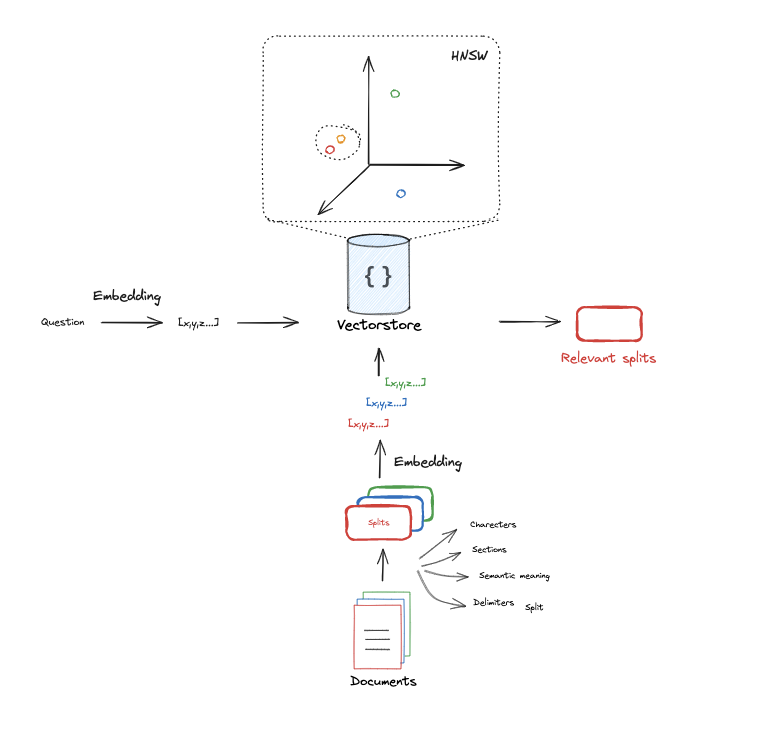

In [3]:
# Documents
question = "What kinds of pets do I like?"
document = "My favorite pet is a cat."

[Count tokens](https://github.com/openai/openai-cookbook/blob/main/examples/How_to_count_tokens_with_tiktoken.ipynb) considering [~4 char / token](https://help.openai.com/en/articles/4936856-what-are-tokens-and-how-to-count-them)

In [4]:
import tiktoken

def num_tokens_from_string(string: str, encoding_name: str) -> int:
    """Returns the number of tokens in a text string."""
    encoding = tiktoken.get_encoding(encoding_name)
    num_tokens = len(encoding.encode(string))
    return num_tokens

num_tokens_from_string(question, "cl100k_base")

8

[Text embedding models](https://python.langchain.com/docs/integrations/text_embedding/openai)

In [5]:
from langchain_openai import OpenAIEmbeddings
embd = OpenAIEmbeddings()
query_result = embd.embed_query(question)
document_result = embd.embed_query(document)
len(query_result)

1536

[Cosine similarity](https://platform.openai.com/docs/guides/embeddings/frequently-asked-questions) is reccomended (1 indicates identical) for OpenAI embeddings.

In [6]:
import numpy as np

def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    return dot_product / (norm_vec1 * norm_vec2)

similarity = cosine_similarity(query_result, document_result)
print("Cosine Similarity:", similarity)

Cosine Similarity: 0.8806581695120701


[Document Loaders](https://python.langchain.com/docs/integrations/document_loaders/)

In [7]:
#### INDEXING ####

# Load confluence page
loader = ConfluenceLoader()
docs = [loader.get_page_content(page_id=PAGE_ID)]

data_processor = DataProcessor()
processed_docs = data_processor.process_documents(docs)

[Splitter](https://python.langchain.com/docs/modules/data_connection/document_transformers/recursive_text_splitter)

> This text splitter is the recommended one for generic text. It is parameterized by a list of characters. It tries to split on them in order until the chunks are small enough. The default list is ["\n\n", "\n", " ", ""]. This has the effect of trying to keep all paragraphs (and then sentences, and then words) together as long as possible, as those would generically seem to be the strongest semantically related pieces of text.

In [8]:
# Split
from langchain.text_splitter import RecursiveCharacterTextSplitter
text_splitter = RecursiveCharacterTextSplitter.from_tiktoken_encoder(
    chunk_size=300, 
    chunk_overlap=50)

# Make splits
splits = text_splitter.split_documents(processed_docs)

[Vectorstores](https://python.langchain.com/docs/integrations/vectorstores/)

In [9]:
# Index
from langchain_openai import OpenAIEmbeddings
from langchain_community.vectorstores import Chroma

# vectorstore = Chroma.from_documents(documents=splits, 
#                                     embedding=OpenAIEmbeddings())

retriever = vectorstore.as_retriever()

## Part 3: Retrieval

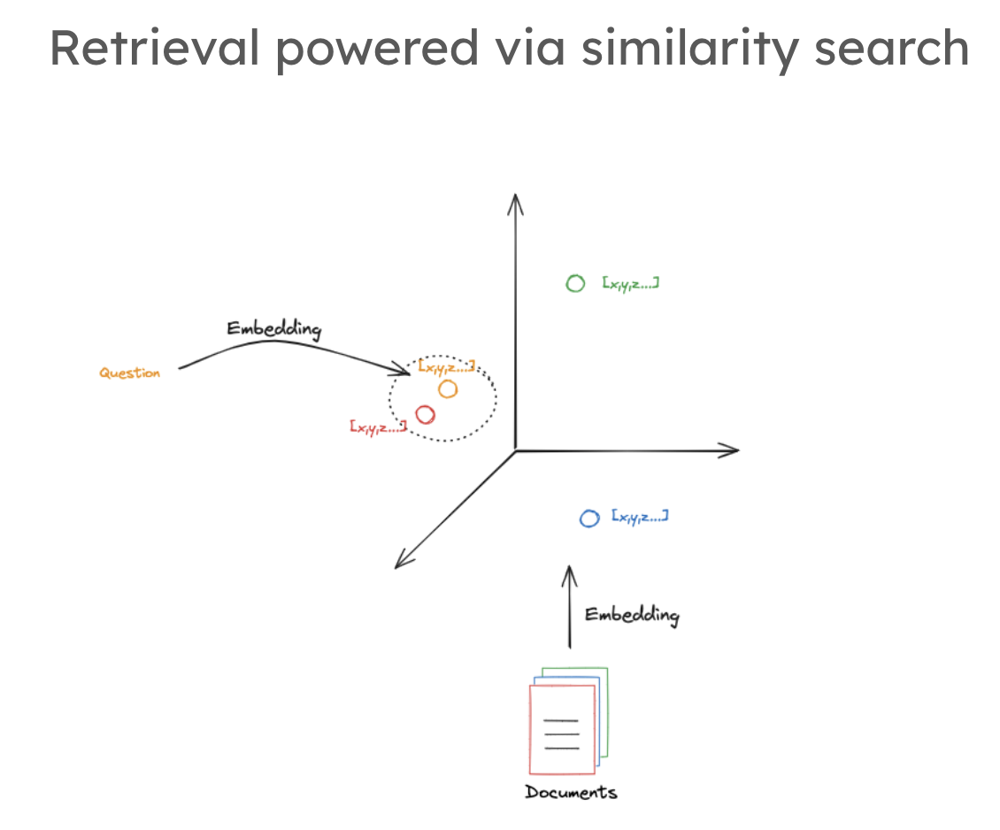

In [10]:
docs = retriever.invoke(QUESTION)

wrapprint(QUESTION)

What is SelectiveKD and how does it improve cancer detection in Digital Breast
Tomosynthesis (DBT)?


In [11]:
for doc in docs:
    wrapprint(doc.page_content)
    print()


SelectiveKD process effectively utilizes unannotated slices from a DBT stack,
leading to significantly improved cancer classification performance (AUC) and
generalization performance. Keywords:  Computer-aided diagnosis, machine
learning, Semi-supervised Learning, Annotation efficiency. 1 Introduction
Digital Breast Tomosynthesis (DBT) offers three-dimensional imaging for breast
cancer screening which improves over the traditional 2D mammography by better
detecting cancer especially from dense breasts [1,8,12,16], lowering false-
positive recall rates [2,17] and demonstrating overall superior cancer detection
rates [6]. Because images are taken from multiple angles, lesions visibility is
enhanced. However, the volumetric nature of the data can also increase the
radiologists' workload caused by longer reading time as they have to go through
an entire stack of images [19]. Recent advances in deep learning-based Computer-
Aided Detection (CAD) systems for DBT offer a promising solution to

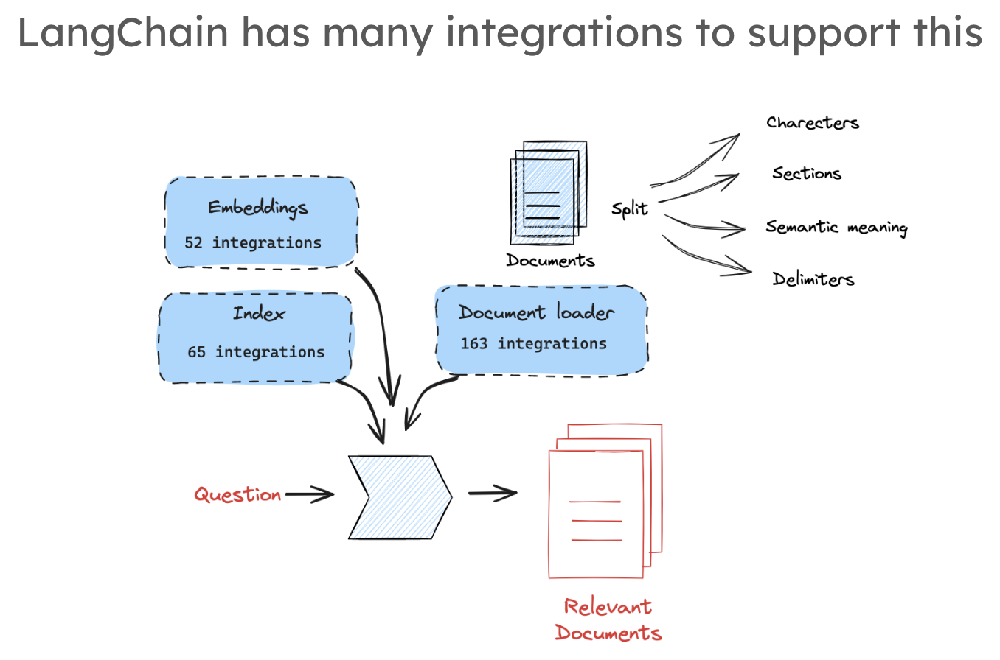

## Part 4: Generation

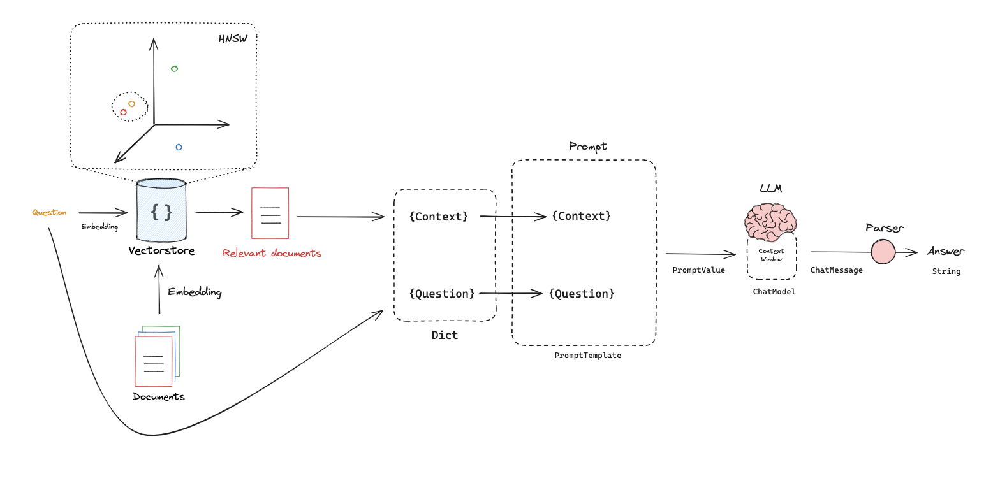

In [12]:
from langchain_openai import ChatOpenAI
from langchain.prompts import ChatPromptTemplate

# Prompt
template = """Answer the question based only on the following context:
{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)
prompt

ChatPromptTemplate(input_variables=['context', 'question'], input_types={}, partial_variables={}, messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context', 'question'], input_types={}, partial_variables={}, template='Answer the question based only on the following context:\n{context}\n\nQuestion: {question}\n'), additional_kwargs={})])

In [13]:
# LLM
llm = ChatOpenAI(model_name="gpt-3.5-turbo", temperature=0)

In [14]:
# Chain
chain = prompt | llm

In [15]:
# Run
chain.invoke({"context":docs,"question":QUESTION})

AIMessage(content='SelectiveKD is a semi-supervised framework for cancer detection in DBT that utilizes unannotated slices from a DBT stack. It improves cancer detection by significantly improving cancer classification performance (AUC) and generalization performance. SelectiveKD leverages pseudo-labeling to select a few slices for training, minimizing potential noise and reinforcing weak annotations. This approach allows for the use of all slices in the DBT stack during training, leading to improved performance in cancer detection.', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 94, 'prompt_tokens': 1039, 'total_tokens': 1133, 'completion_tokens_details': {'reasoning_tokens': 0}, 'prompt_tokens_details': {'cached_tokens': 0}}, 'model_name': 'gpt-3.5-turbo-0125', 'system_fingerprint': None, 'finish_reason': 'stop', 'logprobs': None}, id='run-98c594cc-e0e8-4c1a-a215-fbb72bf6906a-0', usage_metadata={'input_tokens': 1039, 'output_tokens': 94,

In [16]:
from langchain import hub
prompt_hub_rag = hub.pull("rlm/rag-prompt")

In [17]:
prompt_hub_rag

ChatPromptTemplate(input_variables=['context', 'question'], input_types={}, partial_variables={}, metadata={'lc_hub_owner': 'rlm', 'lc_hub_repo': 'rag-prompt', 'lc_hub_commit_hash': '50442af133e61576e74536c6556cefe1fac147cad032f4377b60c436e6cdcb6e'}, messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['context', 'question'], input_types={}, partial_variables={}, template="You are an assistant for question-answering tasks. Use the following pieces of retrieved context to answer the question. If you don't know the answer, just say that you don't know. Use three sentences maximum and keep the answer concise.\nQuestion: {question} \nContext: {context} \nAnswer:"), additional_kwargs={})])

[RAG chains](https://python.langchain.com/docs/expression_language/get_started#rag-search-example)

In [18]:
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough

rag_chain = (
    {"context": retriever, "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

answer = rag_chain.invoke(QUESTION)

print("Question:")
wrapprint(QUESTION)
print("\nAnswer:")
wrapprint(answer)

Question:
What is SelectiveKD and how does it improve cancer detection in Digital Breast
Tomosynthesis (DBT)?

Answer:
SelectiveKD is a semi-supervised learning framework for building cancer
detection models for DBT. It improves cancer detection in DBT by utilizing
unannotated slices from a DBT stack, leading to significantly improved cancer
classification performance (AUC) and generalization performance. It leverages
pseudo-labeling to select a few slices for training, minimizing potential noise
and reinforcing weak annotations. This approach allows for the use of all slices
in the DBT stack during training, ultimately improving cancer detection in DBT.


# Rag From Scratch: Query Transformations

Query transformations are a set of approaches focused on re-writing and / or modifying questions for retrieval.

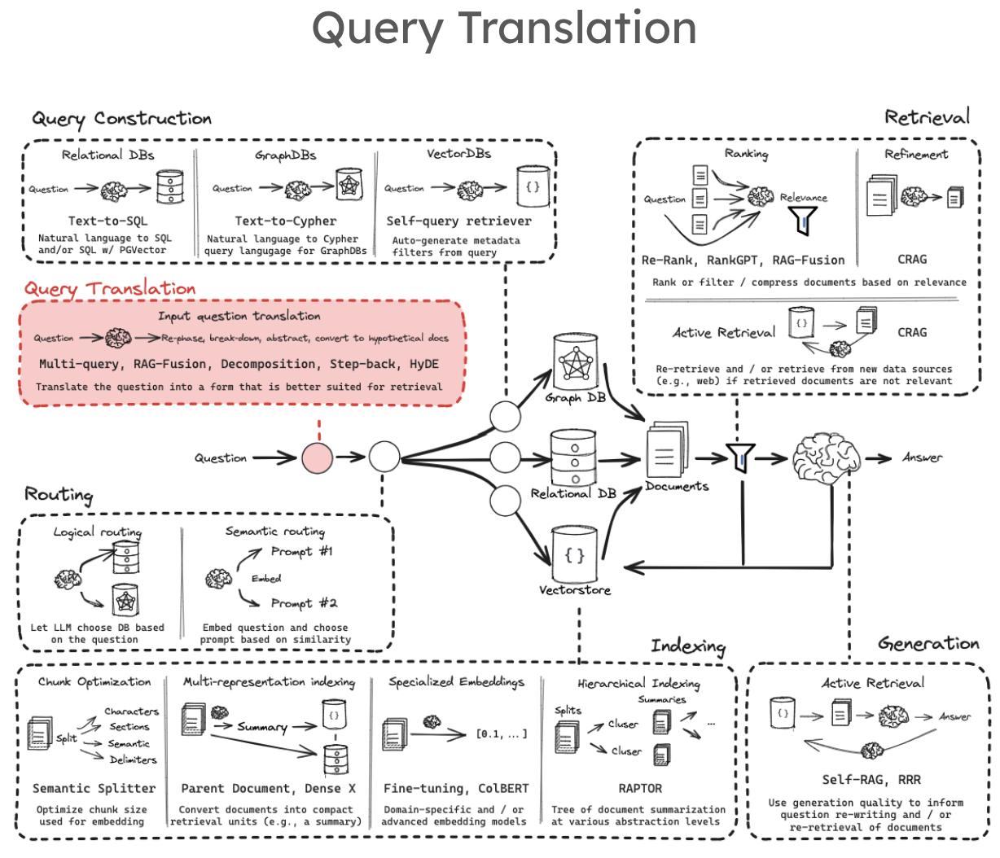

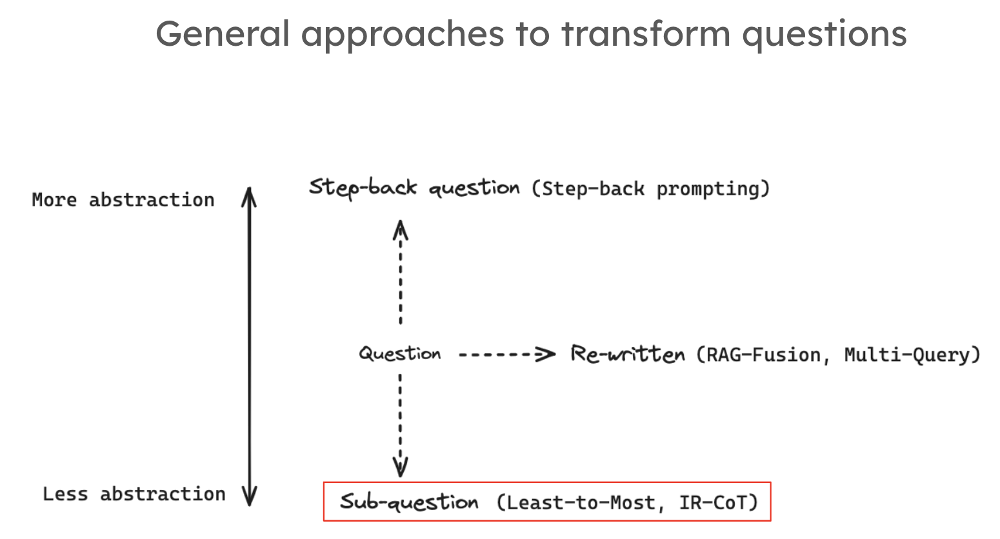

## Method 1: Decomposition

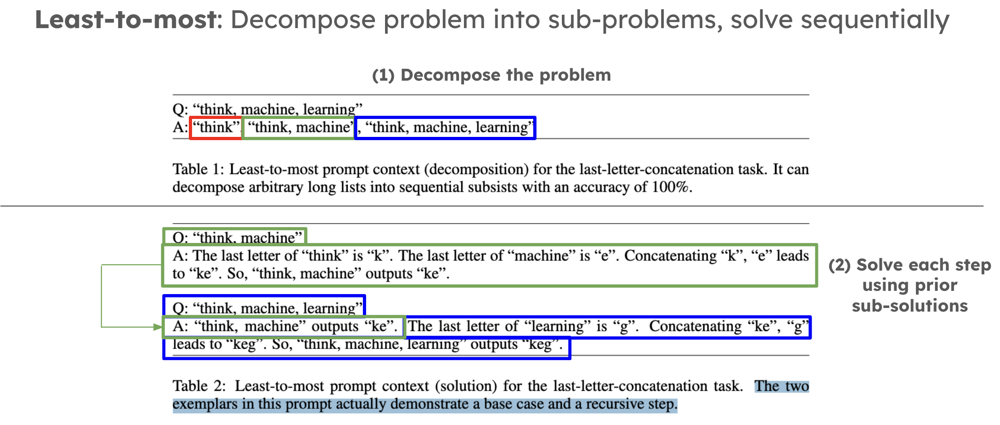

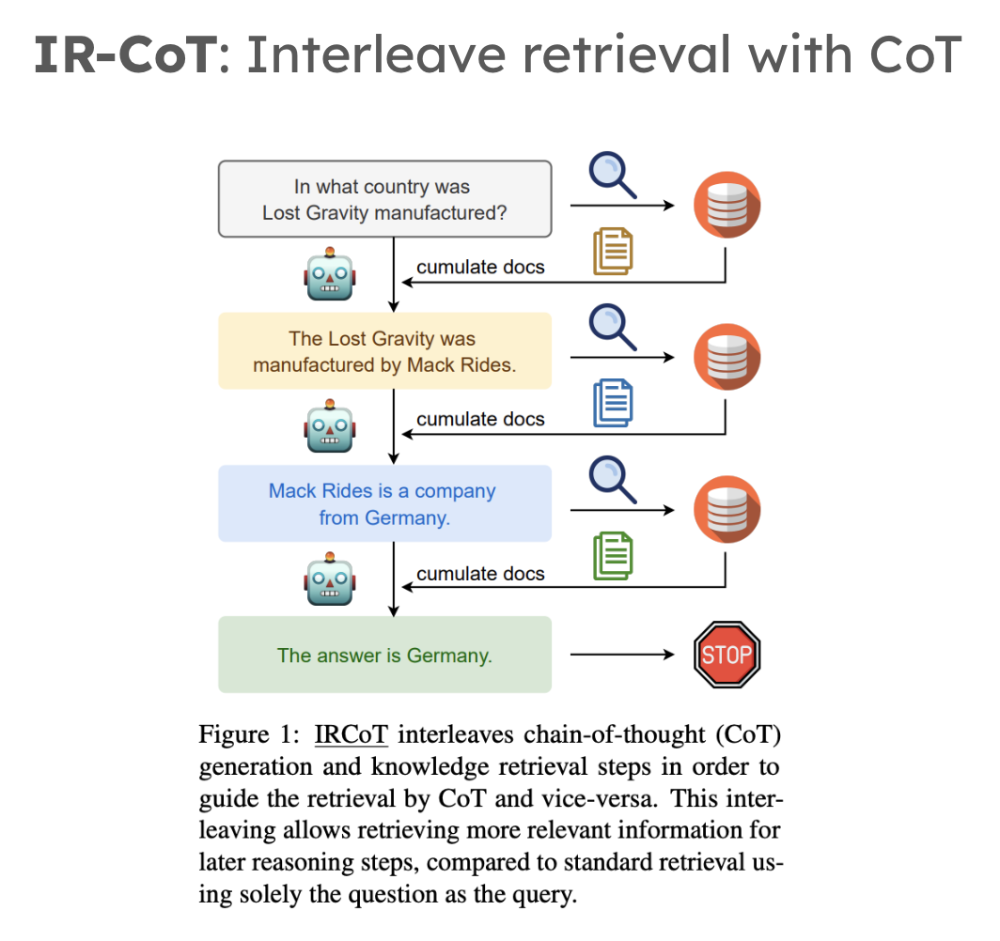

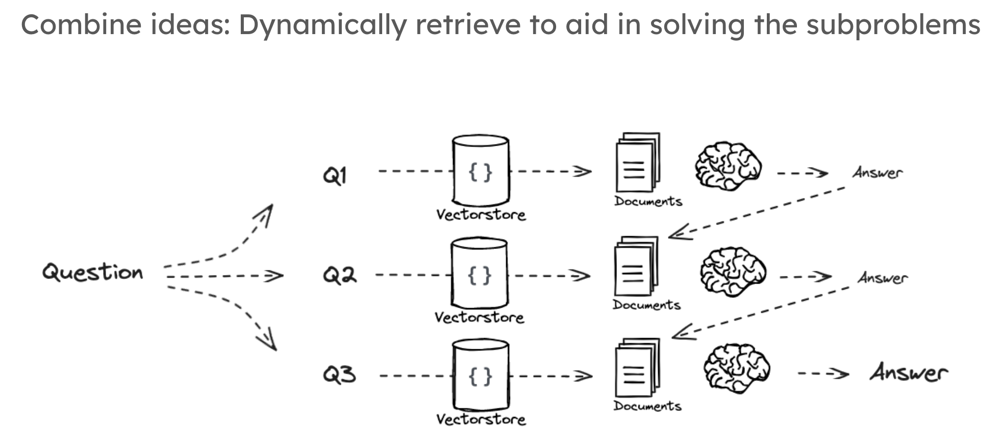

In [19]:
from langchain.prompts import ChatPromptTemplate

# Decomposition
template = """You are a helpful assistant that generates multiple sub-questions related to an input question. \n
The goal is to break down the input into a set of sub-problems / sub-questions that can be answers in isolation. \n
Generate multiple search queries related to: {question} \n
Output (3 queries):"""
prompt_decomposition = ChatPromptTemplate.from_template(template)

In [20]:
from langchain_openai import ChatOpenAI
from langchain_core.output_parsers import StrOutputParser

# LLM
llm = ChatOpenAI(temperature=0)

# Chain
generate_queries_decomposition = ( prompt_decomposition | llm | StrOutputParser() | (lambda x: x.split("\n")))

# Run
question = QUESTION
questions = generate_queries_decomposition.invoke({"question":question})

In [21]:
questions

['1. What is the process of SelectiveKD in the context of cancer detection?',
 '2. How does SelectiveKD specifically enhance the accuracy of cancer detection in Digital Breast Tomosynthesis (DBT)?',
 '3. What are the key benefits of using SelectiveKD for improving cancer detection in DBT compared to traditional methods?']

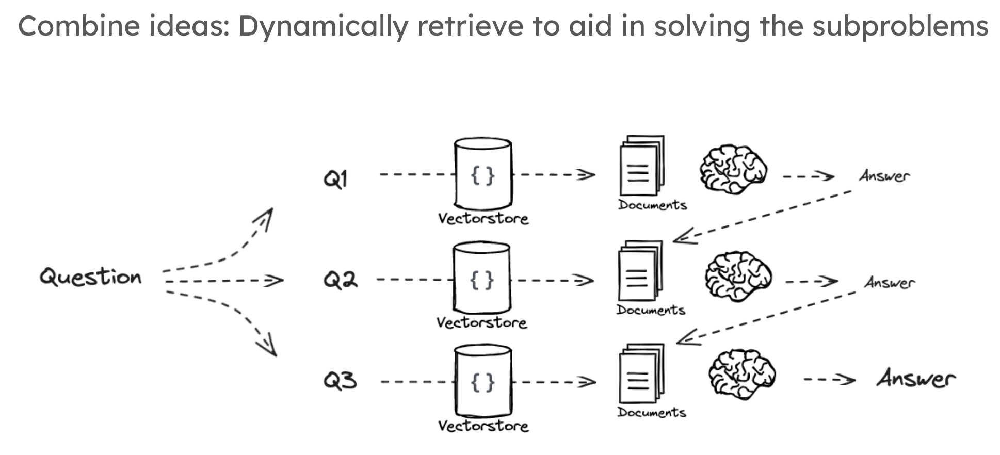

In [22]:
# Prompt
template = """Here is the question you need to answer:

\n --- \n {question} \n --- \n

Here is any available background question + answer pairs:

\n --- \n {q_a_pairs} \n --- \n

Here is additional context relevant to the question: 

\n --- \n {context} \n --- \n

Use the above context and any background question + answer pairs to answer the question: \n {question}
"""

decomposition_prompt = ChatPromptTemplate.from_template(template)

In [23]:
from operator import itemgetter
from langchain_core.output_parsers import StrOutputParser

def format_qa_pair(question, answer):
    """Format Q and A pair"""
    
    formatted_string = ""
    formatted_string += f"Question: {question}\nAnswer: {answer}\n\n"
    return formatted_string.strip()

# llm
llm = ChatOpenAI(model_name="gpt-3.5-turbo", temperature=0)

q_a_pairs = ""
for q in questions:
    
    rag_chain = (
    {"context": itemgetter("question") | retriever, 
     "question": itemgetter("question"),
     "q_a_pairs": itemgetter("q_a_pairs")} 
    | decomposition_prompt
    | llm
    | StrOutputParser())

    answer = rag_chain.invoke({"question":q,"q_a_pairs":q_a_pairs})
    q_a_pair = format_qa_pair(q,answer)
    q_a_pairs = q_a_pairs + "\n---\n"+  q_a_pair

In [24]:
wrapprint(answer)

The key benefits of using SelectiveKD for improving cancer detection in Digital
Breast Tomosynthesis (DBT) compared to traditional methods include:  1. Improved
detection performance: SelectiveKD significantly enhances cancer detection
performance in DBT by leveraging knowledge distillation and pseudo-labeling to
improve model accuracy and generalization capacity.  2. Cost savings:
SelectiveKD requires fewer annotated slices compared to traditional methods,
leading to potential annotation cost savings for building practical CAD systems
for DBT.  3. Generalization across different manufacturers: SelectiveKD
demonstrates the ability to generalize across different DBT device manufacturers
without requiring annotations from the target device manufacturers, making it a
versatile and efficient approach for cancer detection in DBT.  4. Utilization of
unannotated slices: SelectiveKD effectively utilizes unannotated slices from DBT
stacks, leading to improved cancer classification performance a

### Answer individually 

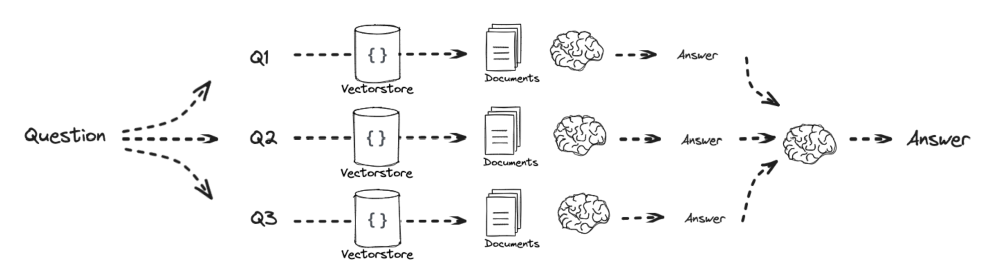

In [25]:
# Answer each sub-question individually 

from langchain import hub
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser

# RAG prompt
prompt_rag = hub.pull("rlm/rag-prompt")

def retrieve_and_rag(question,prompt_rag,sub_question_generator_chain):
    """RAG on each sub-question"""
    
    # Use our decomposition / 
    sub_questions = sub_question_generator_chain.invoke({"question":question})
    
    # Initialize a list to hold RAG chain results
    rag_results = []
    
    for sub_question in sub_questions:
        
        # Retrieve documents for each sub-question
        retrieved_docs = retriever.invoke(sub_question)
        
        # Use retrieved documents and sub-question in RAG chain
        answer = (prompt_rag | llm | StrOutputParser()).invoke({"context": retrieved_docs, 
                                                                "question": sub_question})
        rag_results.append(answer)
    
    return rag_results,sub_questions

# Wrap the retrieval and RAG process in a RunnableLambda for integration into a chain
answers, questions = retrieve_and_rag(QUESTION, prompt_rag, generate_queries_decomposition)

In [26]:
def format_qa_pairs(questions, answers):
    """Format Q and A pairs"""
    
    formatted_string = ""
    for i, (question, answer) in enumerate(zip(questions, answers), start=1):
        formatted_string += f"Question {i}: {question}\nAnswer {i}: {answer}\n\n"
    return formatted_string.strip()

context = format_qa_pairs(questions, answers)

# Prompt
template = """Here is a set of Q+A pairs:

{context}

Use these to synthesize an answer to the question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)

final_rag_chain = (
    prompt
    | llm
    | StrOutputParser()
)

answer = final_rag_chain.invoke({"context":context,"question":QUESTION})
wrapprint(answer)

SelectiveKD is a semi-supervised framework for cancer detection in Digital
Breast Tomosynthesis (DBT) that leverages knowledge distillation and pseudo-
labeling. It enhances the accuracy of cancer detection by selecting a few slices
for training, minimizing noise, and reinforcing weak annotations. This approach
allows for improved cancer classification performance and generalization
capacity across different manufacturers without requiring annotations from
target device manufacturers. SelectiveKD effectively utilizes unannotated
slices, reducing the need for a large number of labeled images and potentially
saving on annotation costs for building practical CAD systems for DBT. Overall,
SelectiveKD improves cancer detection in DBT by enhancing detection performance,
generalization ability, and annotation efficiency compared to traditional
methods.


## Method 2: Step Back

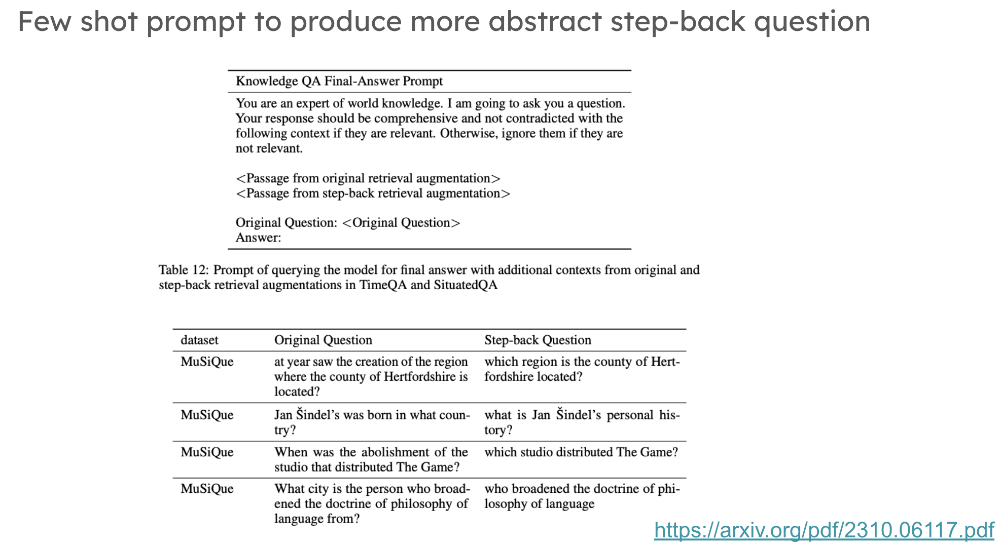

Paper: 

* https://arxiv.org/pdf/2310.06117.pdf

In [27]:
# Few Shot Examples
from langchain_core.prompts import ChatPromptTemplate, FewShotChatMessagePromptTemplate
examples = [
    {
        "input": "Could the members of The Police perform lawful arrests?",
        "output": "what can the members of The Police do?",
    },
    {
        "input": "Jan Sindel’s was born in what country?",
        "output": "what is Jan Sindel’s personal history?",
    },
]
# We now transform these to example messages
example_prompt = ChatPromptTemplate.from_messages(
    [
        ("human", "{input}"),
        ("ai", "{output}"),
    ]
)
few_shot_prompt = FewShotChatMessagePromptTemplate(
    example_prompt=example_prompt,
    examples=examples,
)
prompt = ChatPromptTemplate.from_messages(
    [
        (
            "system",
            """You are an expert at world knowledge. Your task is to step back and paraphrase a question to a more generic step-back question, which is easier to answer. Here are a few examples:""",
        ),
        # Few shot examples
        few_shot_prompt,
        # New question
        ("user", "{question}"),
    ]
)

In [28]:
generate_queries_step_back = prompt | ChatOpenAI(temperature=0) | StrOutputParser()
question = QUESTION
wrapprint(generate_queries_step_back.invoke({"question": question}))

How does SelectiveKD enhance cancer detection in medical imaging technology?


In [29]:
from langchain_core.runnables import RunnableLambda


# Response prompt 
response_prompt_template = """You are an expert of world knowledge. I am going to ask you a question. Your response should be comprehensive and not contradicted with the following context if they are relevant. Otherwise, ignore them if they are not relevant.

# {normal_context}
# {step_back_context}

# Original Question: {question}
# Answer:"""
response_prompt = ChatPromptTemplate.from_template(response_prompt_template)

chain = (
    {
        # Retrieve context using the normal question
        "normal_context": RunnableLambda(lambda x: x["question"]) | retriever,
        # Retrieve context using the step-back question
        "step_back_context": generate_queries_step_back | retriever,
        # Pass on the question
        "question": lambda x: x["question"],
    }
    | response_prompt
    | ChatOpenAI(temperature=0)
    | StrOutputParser()
)

answer = chain.invoke({"question": QUESTION})
wrapprint(answer)

SelectiveKD is a semi-supervised framework for cancer detection in Digital
Breast Tomosynthesis (DBT) that leverages knowledge distillation and pseudo-
labeling to improve cancer detection performance. It addresses the challenge of
obtaining large-scale accurate annotations for DBT by utilizing unannotated
slices from a DBT stack. By using a teacher model to provide a supervisory
signal to a student model for all slices in the DBT volume, SelectiveKD
effectively mitigates potential noise in the supervisory signal.   The framework
also implements a selective dataset expansion strategy using pseudo labels,
allowing for the inclusion of all slices in the DBT stack during training. This
approach leads to significantly improved cancer classification performance, as
demonstrated by the increase in the Area Under the Curve (AUC) metric and
generalization performance.   SelectiveKD has been evaluated on a large-scale
real-world dataset of over 10,000 DBT exams collected from multiple device
ma

## Method 3: HyDE

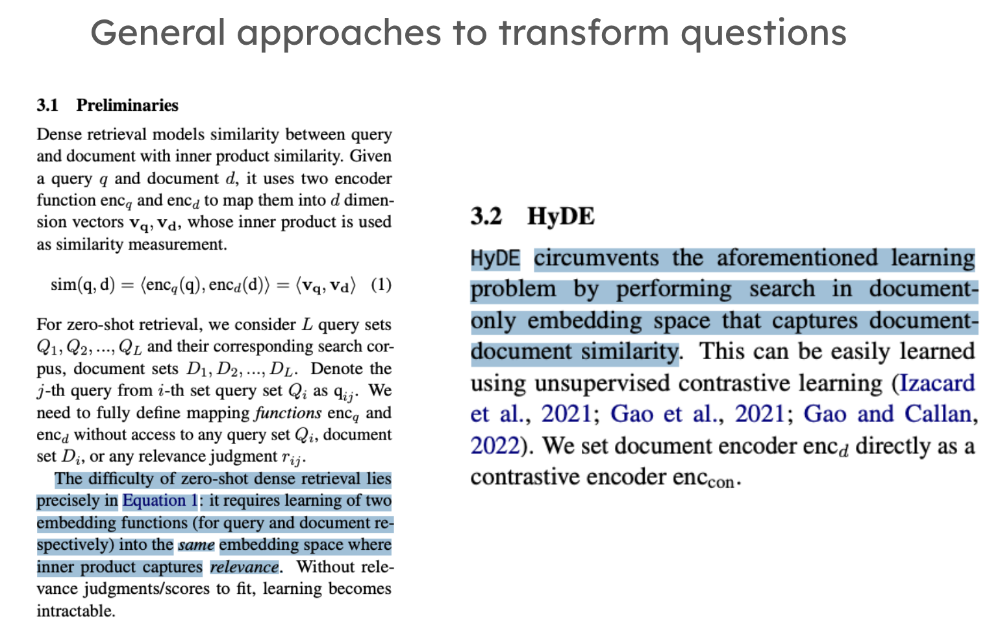

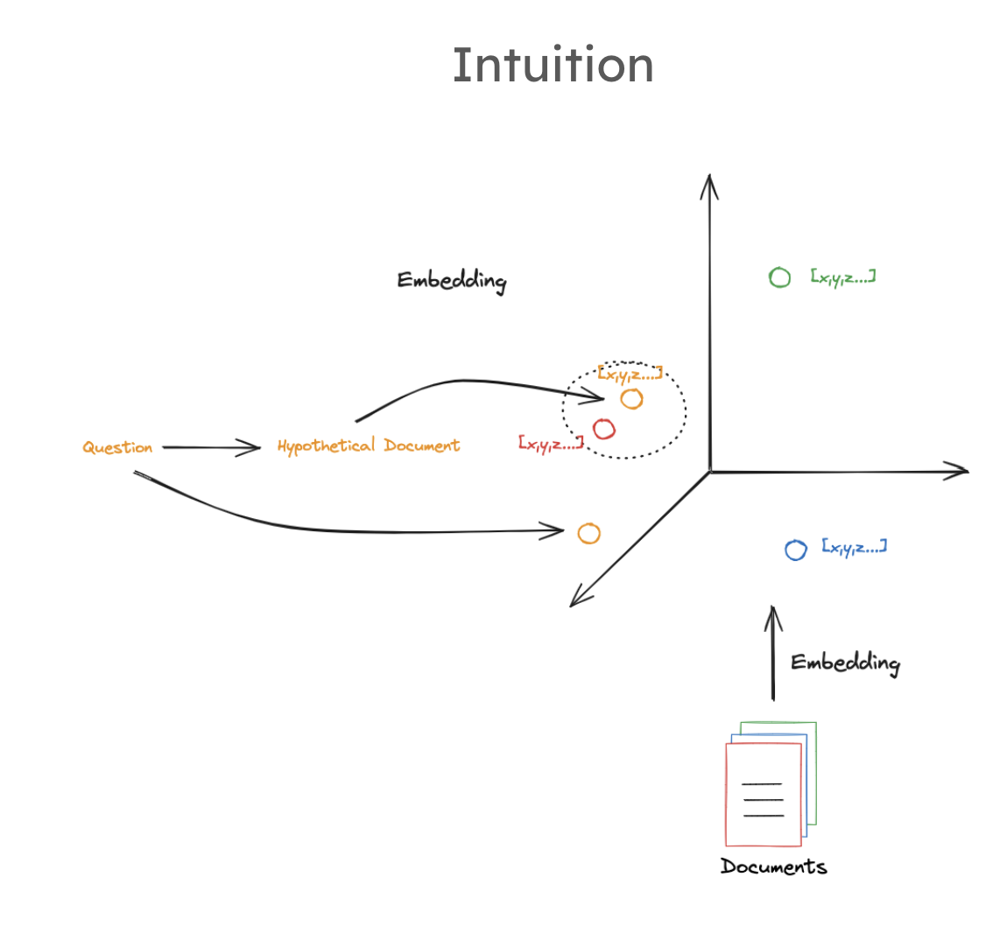

Docs: 

* https://github.com/langchain-ai/langchain/blob/master/cookbook/hypothetical_document_embeddings.ipynb

Paper:

* https://arxiv.org/abs/2212.10496

In [30]:
from langchain.prompts import ChatPromptTemplate

# HyDE document genration
template = """Please write a scientific paper passage to answer the question
Question: {question}
Passage:"""
prompt_hyde = ChatPromptTemplate.from_template(template)

from langchain_core.output_parsers import StrOutputParser
from langchain_openai import ChatOpenAI

generate_docs_for_retrieval = (
    prompt_hyde | ChatOpenAI(temperature=0) | StrOutputParser() 
)

# Run
question = QUESTION
wrapprint(generate_docs_for_retrieval.invoke({"question":question}))

SelectiveKD, or Selective Kernel Density, is a novel image processing technique
that has been developed to improve cancer detection in Digital Breast
Tomosynthesis (DBT). DBT is a three-dimensional imaging modality that has shown
promise in improving the detection of breast cancer compared to traditional
mammography. However, the interpretation of DBT images can still be challenging
due to the presence of overlapping tissue structures and noise.  SelectiveKD
works by selectively enhancing the visibility of suspicious lesions in DBT
images while suppressing background noise and normal tissue structures. This is
achieved through a combination of adaptive kernel density estimation and image
enhancement algorithms. By focusing on the areas of the image that are most
likely to contain cancerous lesions, SelectiveKD helps radiologists to more
accurately identify and diagnose breast cancer.  In a recent study, SelectiveKD
was shown to significantly improve the sensitivity and specificity of c

In [31]:
# Retrieve
retrieval_chain = generate_docs_for_retrieval | retriever 
retireved_docs = retrieval_chain.invoke({"question":QUESTION})
retireved_docs

[Document(metadata={'chunk': 6, 'page_id': '3565977727', 'title': 'SelectiveKD: A semi-supervised framework for cancer detection in DBT through Knowledge Distillation and Pseudo-labeling'}, page_content="real-world dataset of over 10,000 DBT exams, collected from multiple device manufacturers (i.e., Hologic, GE, Siemens) and institutions. We demonstrate that the presented approach not only improves detection performance but also the model's ability to generalize across different manufacturers. We show that our framework achieves this generalization capacity without requiring annotations from the target device manufacturers. Further, by effectively using unlabeled images, we can actually reach the same level of cancer detection performance with considerably fewer labeled images, leading to large potential annotation cost savings for building practical CAD systems for DBT. Fig. 1.  Overview of the SelectiveKD framework: Illustrating the application of knowledge distillation (KD) and Sele

In [32]:
# RAG
template = """Answer the following question based on this context:

{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)

final_rag_chain = (
    prompt
    | llm
    | StrOutputParser()
)

answer = final_rag_chain.invoke({"context":retireved_docs,"question":QUESTION})
wrapprint(answer)

SelectiveKD is a semi-supervised learning framework for building cancer
detection models for DBT that only requires a limited number of annotated slices
to reach high performance. It utilizes unlabeled slices available in a DBT stack
through a knowledge distillation framework, where the teacher model provides a
supervisory signal to the student model for all slices in the DBT volume.
SelectiveKD mitigates potential noise in the supervisory signal by implementing
a selective dataset expansion strategy using pseudo labels. By effectively
utilizing unannotated slices from a DBT stack, SelectiveKD leads to
significantly improved cancer classification performance (AUC) and
generalization performance.


# Rag From Scratch: Indexing

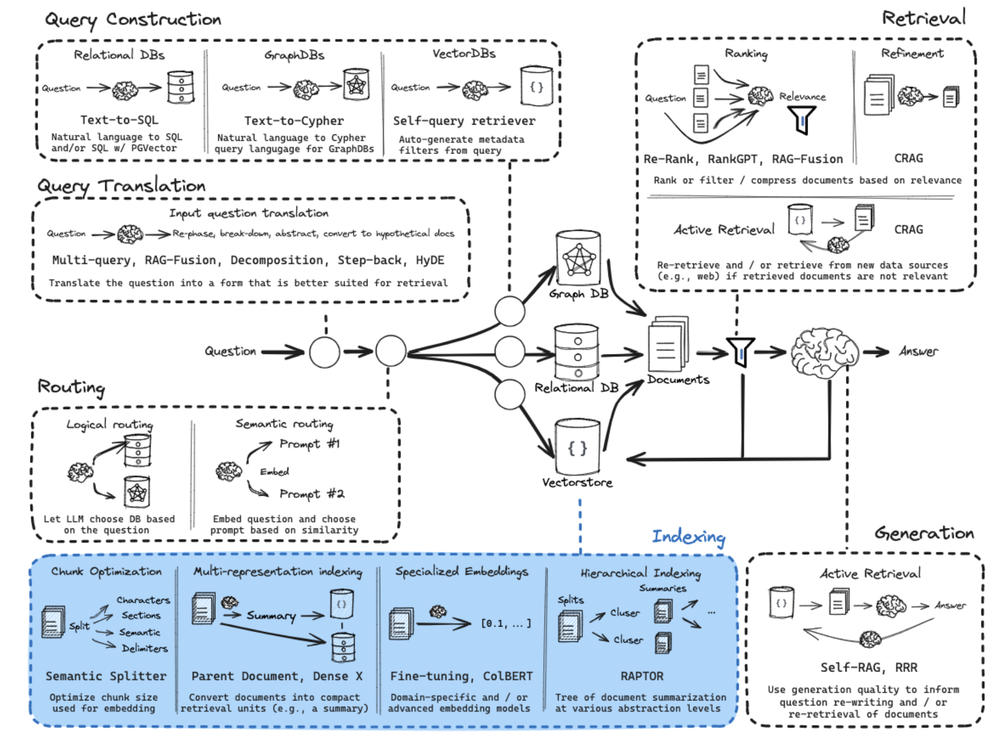

## Preface: Chunking

We don't explicity cover document chunking / splitting.

For an excellent review of document chunking, see this video from Greg Kamradt:

https://www.youtube.com/watch?v=8OJC21T2SL4


## Method 1: Multi-representation Indexing

Flow: 

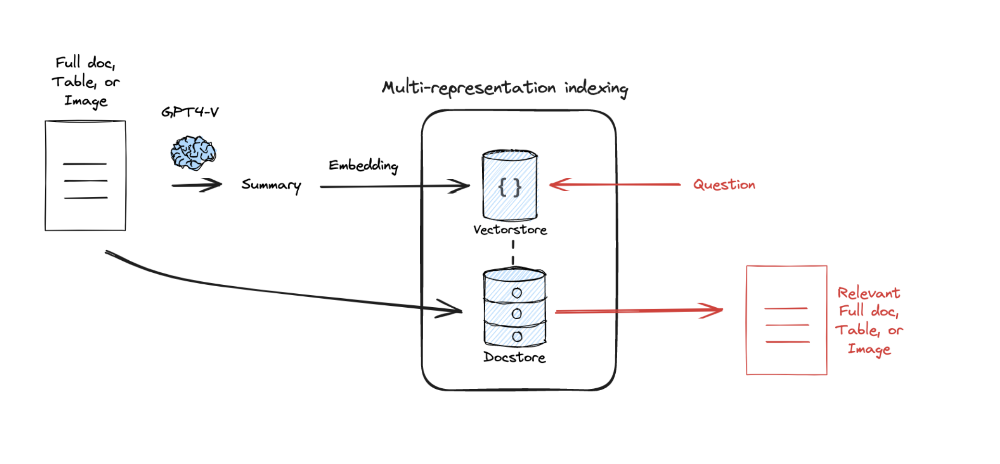

Docs:

https://blog.langchain.dev/semi-structured-multi-modal-rag/

https://python.langchain.com/docs/modules/data_connection/retrievers/multi_vector

Paper:

https://arxiv.org/abs/2312.06648

In [1]:
from dotenv import load_dotenv
load_dotenv()

PAGE_ID1 = "3565977727"  # SelectiveKD
PAGE_ID2 = "3567124489"  # DBT-Neighbor

QUESTION = "What was the AUC performance of the TimeSformer model compared to the Conv3D model for detecting soft-tissue lesions in the subgroup analysis?"

In [3]:
import textwrap
from langchain.text_splitter import RecursiveCharacterTextSplitter
from src.data_loader.confluence_loader import ConfluenceLoader
from src.data_processor.processor import DataProcessor

def wrapprint(text, width=80):
    print(textwrap.fill(text, width=width))

loader = ConfluenceLoader()
docs = [loader.get_page_content(page_id=page_id) for page_id in [PAGE_ID1, PAGE_ID2]]

# Split
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
splits = text_splitter.split_documents(docs)

In [4]:
import uuid

from langchain_core.documents import Document
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate
from langchain_openai import ChatOpenAI

chain = (
    {"doc": lambda x: x.page_content}
    | ChatPromptTemplate.from_template("Summarize the following document:\n\n{doc}")
    | ChatOpenAI(model="gpt-3.5-turbo",max_retries=0)
    | StrOutputParser()
)

summaries = chain.batch(docs, {"max_concurrency": 5})

In [6]:
from langchain.storage import InMemoryByteStore
from langchain_openai import OpenAIEmbeddings
from langchain_community.vectorstores import Chroma
from langchain.retrievers.multi_vector import MultiVectorRetriever

# The vectorstore to use to index the child chunks
vectorstore = Chroma(collection_name="summaries",
                     embedding_function=OpenAIEmbeddings())

# The storage layer for the parent documents
store = InMemoryByteStore()
id_key = "doc_id"

# The retriever
retriever = MultiVectorRetriever(
    vectorstore=vectorstore,
    byte_store=store,
    id_key=id_key,
)
doc_ids = [str(uuid.uuid4()) for _ in docs]

# Docs linked to summaries
summary_docs = [
    Document(page_content=s, metadata={id_key: doc_ids[i]})
    for i, s in enumerate(summaries)
]

# Add
retriever.vectorstore.add_documents(summary_docs)
retriever.docstore.mset(list(zip(doc_ids, docs)))

/tmp/ipykernel_3949817/21713248.py:7: LangChainDeprecationWarning: The class `Chroma` was deprecated in LangChain 0.2.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-chroma package and should be used instead. To use it run `pip install -U :class:`~langchain-chroma` and import as `from :class:`~langchain_chroma import Chroma``.
  vectorstore = Chroma(collection_name="summaries",


In [7]:
sub_docs = vectorstore.similarity_search(QUESTION, k=1)

wrapprint(QUESTION)
wrapprint(sub_docs[0].page_content)


What was the AUC performance of the TimeSformer model compared to the Conv3D
model for detecting soft-tissue lesions in the subgroup analysis?
The document describes the development of a deep neural network model using a
transformer-based architecture to detect breast cancer on digital breast
tomosynthesis (DBT) images. The authors compared this model with two baselines,
one using three-dimensional (3D) convolutions and another analyzing each section
individually. The transformer-based model showed better classification
performance on a test set of 655 DBT studies, demonstrating increased
sensitivity, specificity, and area under the receiver operating characteristic
curve compared to the baseline models. The study also highlighted the
computational efficiency of the transformer-based model. Additional subgroup
analyses were conducted to evaluate model performance in different scenarios.
The authors concluded that the transformer-based model improved breast cancer
classification perform

In [8]:
retrieved_docs = retriever.invoke(QUESTION, n_results=1)
wrapprint(DataProcessor()._clean_html(retrieved_docs[0].page_content[0:500]))

Number of requested results 4 is greater than number of elements in index 2, updating n_results = 2


https://pubs.rsna.org/doi/pdf/10.1148/ryai.220159 Weonsuk Lee, MSc • Hyeonsoo
Lee, MSc • Hyunjae Lee, MSc • Eun Kyung Park, MD, PhD • Hyeonseob Nam, MSc •
Thijs Kooi, MSc, PhD From Lunit, 5F, 374 Gangnam-daero, Gangnam-gu, Seoul 06241,
Republic of Korea. Received August 2, 2022; revision requested September 21,
December 23, March 28, 2023; revision received April 12, 2023; accepted April
24. A


# Rag From Scratch: Retrieval

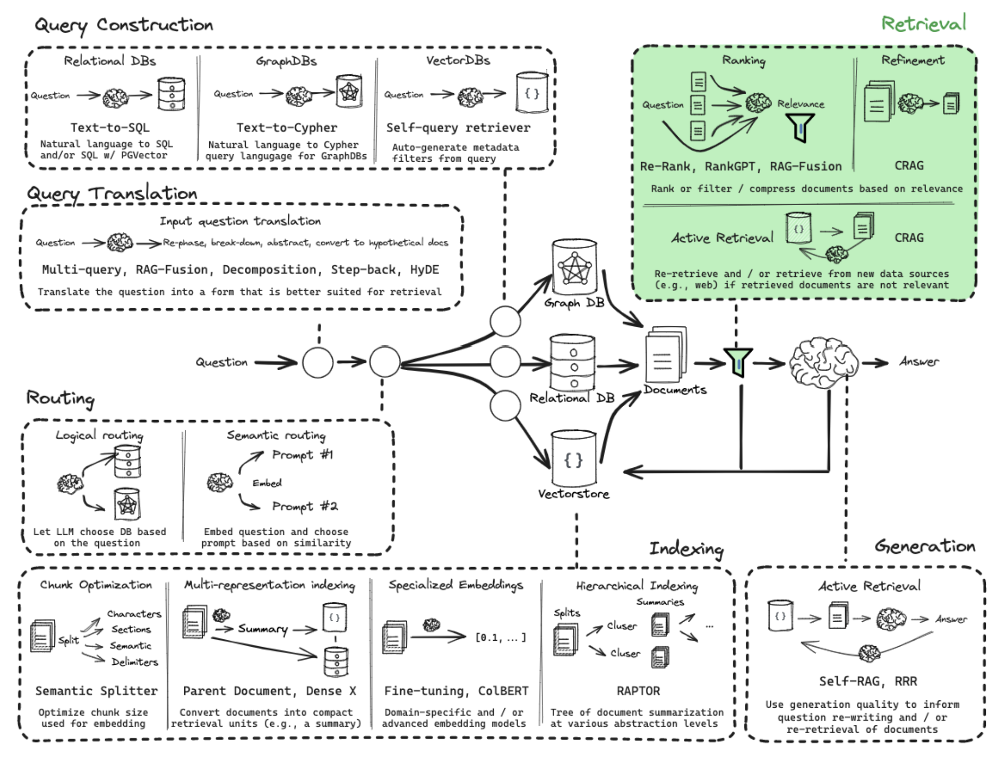

## Method 1: Re-ranking

We showed this previously with RAG-fusion.

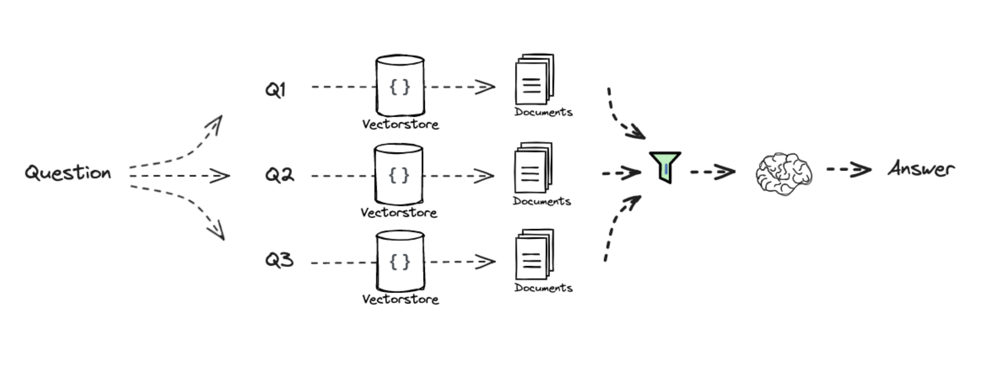

In [1]:
from dotenv import load_dotenv
load_dotenv()

PAGE_ID = "3565977727"  # SelectiveKD

QUESTION = "What is SelectiveKD and how does it improve cancer detection in Digital Breast Tomosynthesis (DBT)?"


In [2]:
import textwrap
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.vectorstores import Chroma
from langchain_openai import OpenAIEmbeddings

from src.data_loader.confluence_loader import ConfluenceLoader
from src.data_processor.processor import DataProcessor

def wrapprint(text, width=80):
    print(textwrap.fill(text, width=width))

#### INDEXING ####
loader = ConfluenceLoader()
docs = [loader.get_page_content(page_id=PAGE_ID)]

data_processor = DataProcessor()
processed_docs = data_processor.process_documents(docs)

# Split
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
splits = text_splitter.split_documents(processed_docs)

# Embed
vectorstore = Chroma.from_documents(documents=splits, 
                                    embedding=OpenAIEmbeddings())

retriever = vectorstore.as_retriever()


In [3]:
from langchain.prompts import ChatPromptTemplate

# RAG-Fusion
template = """You are a helpful assistant that generates multiple search queries based on a single input query. \n
Generate multiple search queries related to: {question} \n
Output (4 queries):"""
prompt_rag_fusion = ChatPromptTemplate.from_template(template)

In [4]:
from langchain_core.output_parsers import StrOutputParser
from langchain_openai import ChatOpenAI

generate_queries = (
    prompt_rag_fusion 
    | ChatOpenAI(temperature=0)
    | StrOutputParser() 
    | (lambda x: x.split("\n"))
)

In [5]:
from langchain.load import dumps, loads

def reciprocal_rank_fusion(results: list[list], k=60):
    """ Reciprocal_rank_fusion that takes multiple lists of ranked documents 
        and an optional parameter k used in the RRF formula """
    
    # Initialize a dictionary to hold fused scores for each unique document
    fused_scores = {}

    # Iterate through each list of ranked documents
    for docs in results:
        # Iterate through each document in the list, with its rank (position in the list)
        for rank, doc in enumerate(docs):
            # Convert the document to a string format to use as a key (assumes documents can be serialized to JSON)
            doc_str = dumps(doc)
            # If the document is not yet in the fused_scores dictionary, add it with an initial score of 0
            if doc_str not in fused_scores:
                fused_scores[doc_str] = 0
            # Retrieve the current score of the document, if any
            previous_score = fused_scores[doc_str]
            # Update the score of the document using the RRF formula: 1 / (rank + k)
            fused_scores[doc_str] += 1 / (rank + k)

    # Sort the documents based on their fused scores in descending order to get the final reranked results
    reranked_results = [
        (loads(doc), score)
        for doc, score in sorted(fused_scores.items(), key=lambda x: x[1], reverse=True)
    ]

    # Return the reranked results as a list of tuples, each containing the document and its fused score
    return reranked_results

retrieval_chain_rag_fusion = generate_queries | retriever.map() | reciprocal_rank_fusion
docs = retrieval_chain_rag_fusion.invoke({"question": QUESTION})
len(docs)

/tmp/ipykernel_345543/456930761.py:26: LangChainBetaWarning: The function `loads` is in beta. It is actively being worked on, so the API may change.
  (loads(doc), score)


5

In [6]:
from operator import itemgetter

# RAG
template = """Answer the following question based on this context:

{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)

llm = ChatOpenAI(temperature=0)

final_rag_chain = (
    {"context": retrieval_chain_rag_fusion, 
     "question": itemgetter("question")} 
    | prompt
    | llm
    | StrOutputParser()
)

answer = final_rag_chain.invoke({"question":QUESTION})

print("Question:")
wrapprint(QUESTION)
print("\nAnswer:")
wrapprint(answer)

Question:
What is SelectiveKD and how does it improve cancer detection in Digital Breast
Tomosynthesis (DBT)?

Answer:
SelectiveKD is a semi-supervised learning framework for building cancer
detection models for DBT. It only requires a limited number of annotated slices
to reach high performance by utilizing unlabeled slices available in a DBT stack
through a knowledge distillation framework. SelectiveKD leverages pseudo-
labeling to select a few slices for training, minimizing potential noise and
reinforcing weak annotations. This approach allows for the use of all slices in
the DBT stack during training, leading to significantly improved cancer
classification performance (AUC) and generalization performance.


We can also use [Cohere Re-Rank](https://python.langchain.com/docs/integrations/retrievers/cohere-reranker#doing-reranking-with-coherererank). 

See [here](https://txt.cohere.com/rerank/):

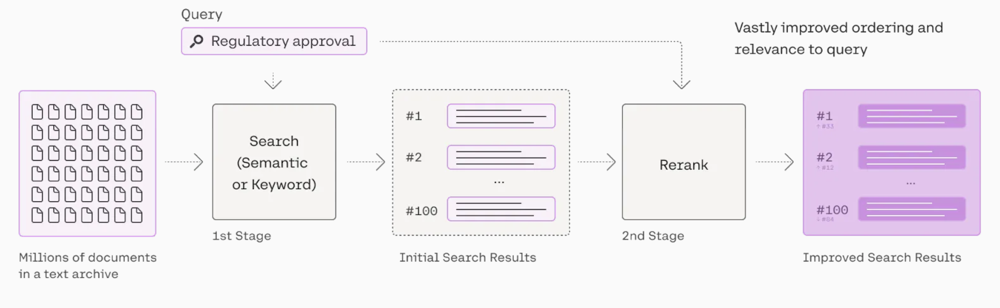

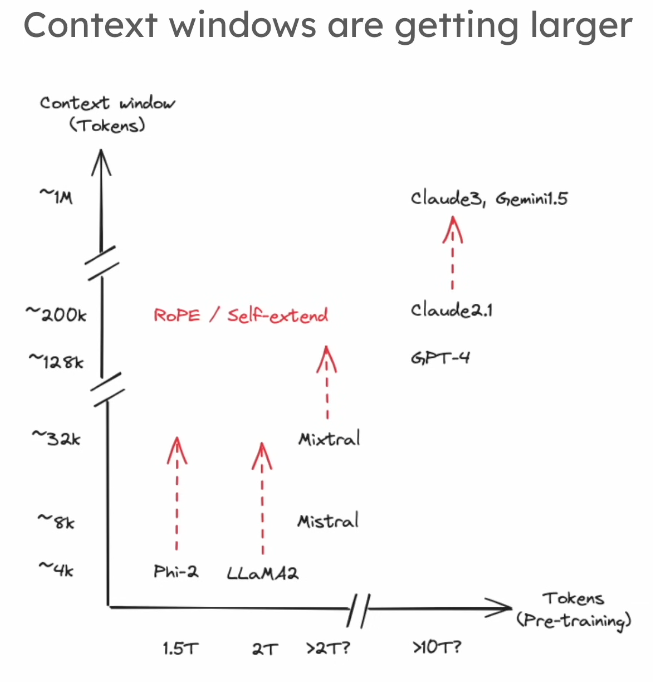

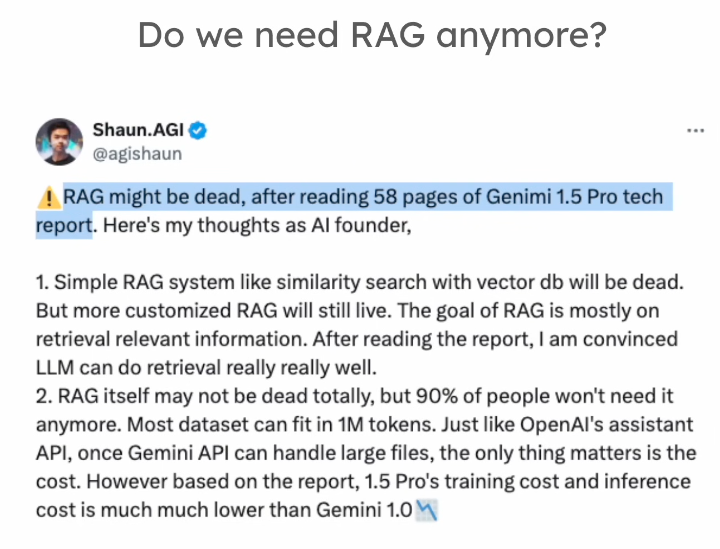

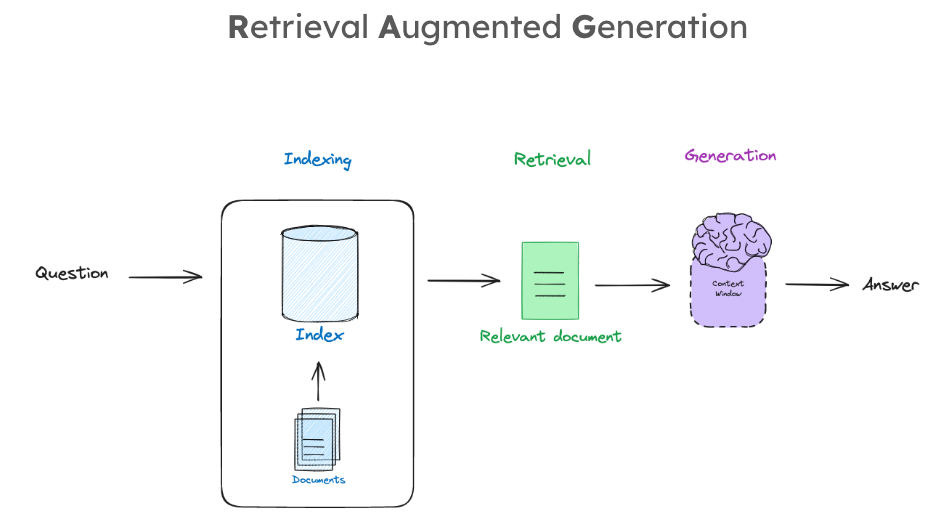

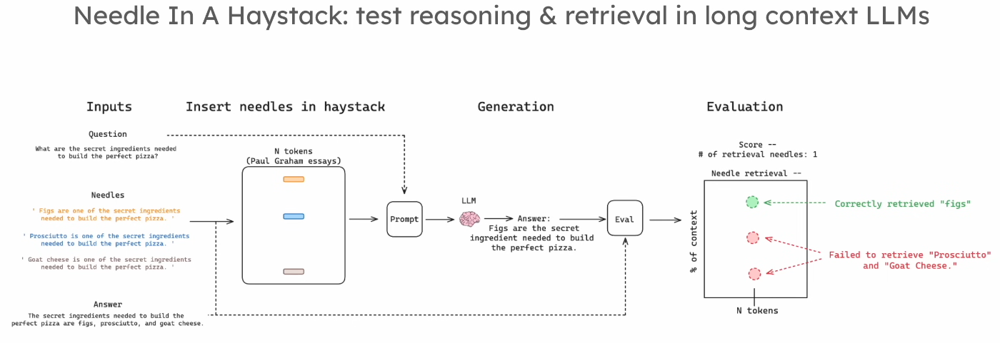

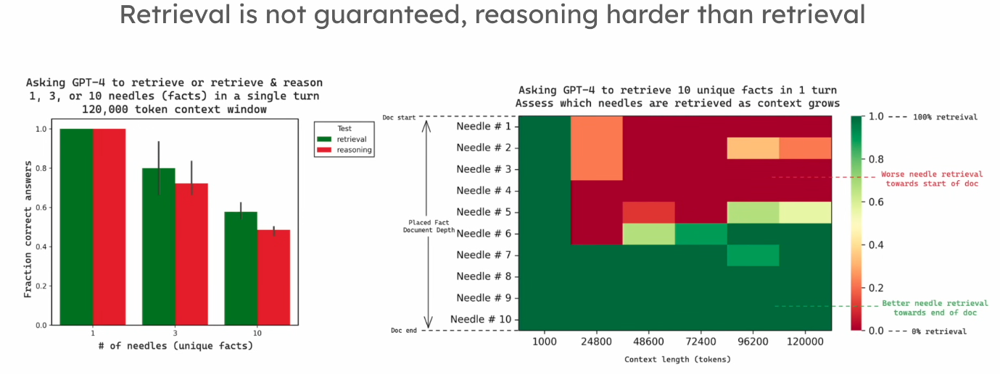

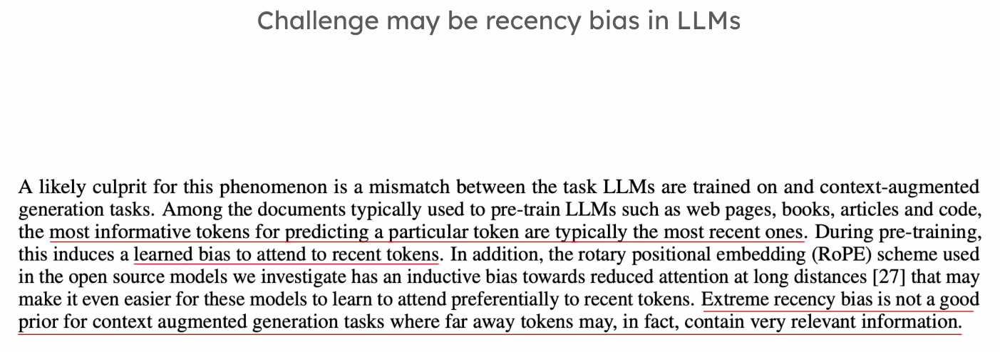

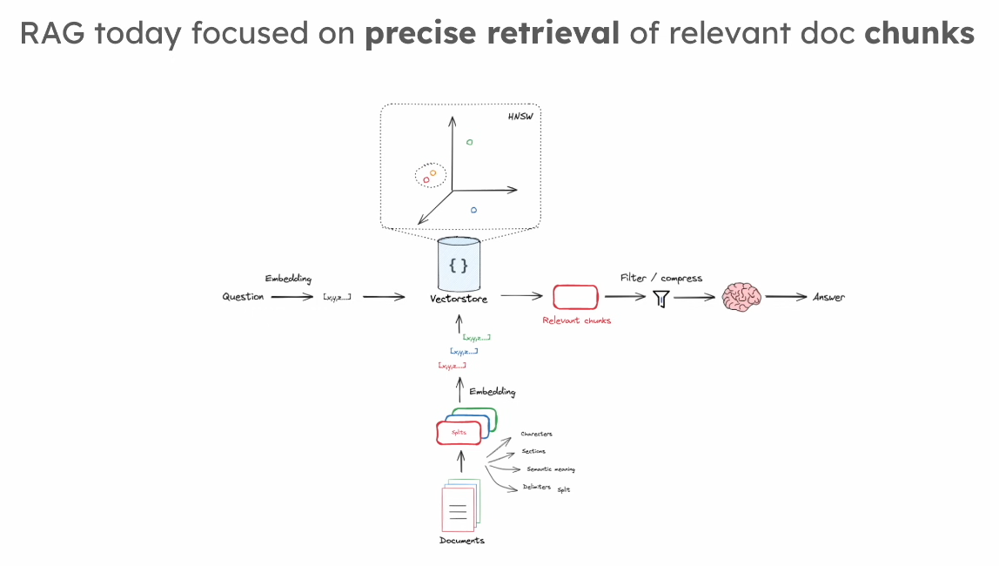